# ImageNetS50 test

Before running this notebook please download the required data. The easiest way is to run `Imagenet_data_prep.ipynb` notebook.

### Imports and definitions

In [1]:
import pandas as pd
import torch
import torchvision.transforms.functional as transform
import torchvision.transforms.functional as F
from EnsembleXAI import Ensemble, Metrics
from torchvision.transforms import Resize, CenterCrop
import os
from PIL import Image
from torchvision.models import resnet50, ResNet50_Weights
import urllib.request
import json
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
from captum.attr import IntegratedGradients, Occlusion, NoiseTunnel, visualization as viz, Saliency
import matplotlib.pyplot as plt
import pickle

### Path setting

Adjust paths below to match to your directory structure.

In [ ]:
input_dir = "\\".join(os.getcwd().split(sep="\\")[:-2] + ['input'])
masks_dir = input_dir + f'\\ImageNetS50\\train-semi-segmentation\\'
images_dir = os.getcwd() + "\\images\\"

In [9]:
# input_dir = os.path.join('..', '..', 'input')
# masks_dir = os.path.join(input_dir, 'ImageNetS50', 'train-semi-segmentation')
# images_dir = os.path.join(input_dir, 'images')

In [2]:
with urllib.request.urlopen("https://s3.amazonaws.com/deep-learning-models/image-models/imagenet_class_index.json") as url:
    imagenet_classes_dict = json.load(url)
with urllib.request.urlopen("https://raw.githubusercontent.com/LUSSeg/ImageNet-S/main/data/categories/ImageNetS_categories_im50.txt") as url:
    imagenetS50_ids_dict = {str(x).replace("b'", "").replace("\\n'", "").replace("'",""):i+1 for i, x in enumerate(url)}

# Images load

In [3]:
def download_class_images(class_id, masks_path):
    full_path = masks_path + class_id + "\\"
    kaggle_path = f"/ILSVRC/Data/CLS-LOC/train/{class_id}/"
    for file_name in os.listdir(full_path):
        file_name_jpeg = file_name[:-3] + 'JPEG'
        !kaggle competitions download -f {kaggle_path}{file_name_jpeg} -p ./images/{class_id}/ -c imagenet-object-localization-challenge


def download():
    skipped = []
    for class_id in os.listdir(masks_dir):
        image_class_path = os.path.join(images_dir, class_id)
        if os.path.exists(image_class_path) and len(os.listdir(image_class_path)) == 10:
            skipped.append(class_id)
            continue
        #download_class_images(class_id, masks_dir)
        print(f"Downloaded {class_id}")
    print("Full dirs: " + str(len(skipped)))


def images_list(image_path, resize=True):
    _crop = CenterCrop(224).forward
    _resize = Resize(232).forward
    images = []
    for image_name in os.listdir(image_path):
        image = Image.open(image_path + image_name)
        if image.mode == 'L':
            image = image.convert(mode='RGB')
        if resize:
            image = _crop(_resize(image))
        images.append(image)
    return images

def load_all(classid):
    all_img = images_list(images_dir + classid + "\\")
    all_img_org = images_list(images_dir + classid + "\\", resize=False)
    all_tens = [F.to_tensor(img) for img in all_img]
    all_msks = [F.pil_to_tensor(img) for img in images_list(masks_dir + classid + "\\")]
    all_msks = [((temp[1] * 256 + temp[0]) == imagenetS50_ids_dict[classid]).float().repeat(3,1,1) for temp in all_msks]
    all_tens = [tens.repeat(3,1,1) if tens.shape[0]==1 else tens for tens in all_tens]
    tens_img = torch.stack(all_tens)
    tens_msks = torch.stack(all_msks)#[:,0].unsqueeze(dim=1).repeat(1, tens_img.shape[1], 1, 1)
    return all_img, all_img_org, all_tens, all_msks, tens_img, tens_msks

def dict_to_matrix(original_data, explanations_dict, predictor, masks_tensor):
    df = pd.DataFrame()
    #impact_thresh = 0.4
    #accordance_thresh = 0.2
    for key, value in explanations_dict.items():
        for thresh in range(10):
            thresh_val = thresh/10
            df.loc[key, f"DIR{thresh_val}"] = Metrics.decision_impact_ratio(original_data, predictor, value, thresh_val, 0)
            df.loc[key, f"CIR Same{thresh_val}"] = Metrics.confidence_impact_ratio(original_data, predictor, value, thresh_val, 0, compare_to="same_prediction")
            df.loc[key, f"CIR Max{thresh_val}"] = Metrics.confidence_impact_ratio(original_data, predictor, value, thresh_val, 0, compare_to="new_prediction")
            df.loc[key, f"Average Recall{thresh_val}"] = torch.mean(Metrics.accordance_recall(value, masks_tensor, thresh_val)).item()
            df.loc[key, f"Average Precision{thresh_val}"] = torch.mean(Metrics.accordance_precision(value, masks_tensor, thresh_val)).item()
            df.loc[key, f"F1_score{thresh_val}"] = Metrics.F1_score(explanations_dict[key], masks_tensor, thresh_val)
            df.loc[key, f"IOU{thresh_val}"] = Metrics.intersection_over_union(explanations_dict[key], masks_tensor, thresh_val)
    return df

In [13]:
all_classes = next(os.walk(images_dir))[1]
print(all_classes)

['n04562935', 'n02483362', 'n06794110']


In [12]:
id = all_classes[10] #n02325366
print(id)
if not os.path.exists(f'results/{id}'):
    os.mkdir(f'results/{id}')
all_images, all_images_original, all_tensors, all_masks, tensor_images, tensor_masks = load_all(id)

IndexError: list index out of range

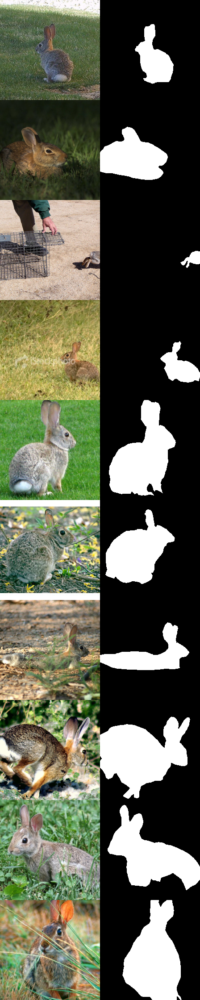

In [6]:
photos = []
for tensor, mask in zip(all_tensors, all_masks):
    photo = torch.cat([tensor, mask], dim=2)
    photos.append(photo)
display(transform.to_pil_image(torch.cat(photos, dim=1)))

# Model Loading

In [5]:
model = resnet50(weights=ResNet50_Weights.DEFAULT)
model.eval()
resnet_transform = ResNet50_Weights.DEFAULT.transforms()
pipeline = lambda images: torch.stack([resnet_transform(image) for image in images])

In [8]:
proper_data = pipeline(all_images_original)
outputs2 = model(proper_data)
_, preds2 = torch.max(outputs2, 1)
probs2 = torch.nn.functional.softmax(outputs2, dim=1)
[imagenet_classes_dict[str(i.item())][1] for i in preds2]

['wood_rabbit',
 'wood_rabbit',
 'wood_rabbit',
 'wood_rabbit',
 'wood_rabbit',
 'wood_rabbit',
 'wood_rabbit',
 'wood_rabbit',
 'wood_rabbit',
 'wood_rabbit']

# Single Explanations

In [9]:
single_pred = preds2[2].unsqueeze(dim=0)
single_data = proper_data[2].unsqueeze(dim=0)
integrated_gradients = IntegratedGradients(model)
attributions_ig = integrated_gradients.attribute(single_data, target=single_pred, n_steps=200)

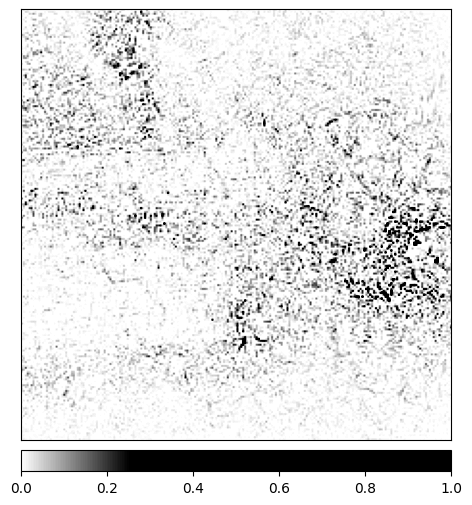

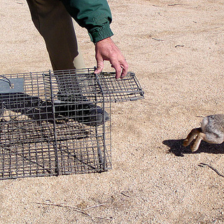

In [10]:
transformed_img = resnet_transform(all_images_original[2])
default_cmap = LinearSegmentedColormap.from_list('custom blue',
                                                 [(0, '#ffffff'),
                                                  (0.25, '#000000'),
                                                  (1, '#000000')], N=256)

_ = viz.visualize_image_attr(np.transpose(attributions_ig.squeeze().cpu().detach().numpy(), (1,2,0)),
                             np.transpose(transformed_img.squeeze().cpu().detach().numpy(), (1,2,0)),
                             method='heat_map',
                             cmap=default_cmap,
                             show_colorbar=True,
                             sign='positive',
                             outlier_perc=1)
display(all_images[2])

In [11]:
import gc
gc.collect()

155

In [12]:
noise_tunnel = NoiseTunnel(integrated_gradients)

attributions_ig_nt = noise_tunnel.attribute(single_data, nt_samples=5, nt_type='smoothgrad_sq', target=single_pred)

In [13]:
%%time
attributions_ig_nt_all = torch.cat([noise_tunnel.attribute(tensor_images[i].unsqueeze(dim=0), nt_samples=5, nt_type='smoothgrad_sq', target=preds2[i].unsqueeze(dim=0)) for i in range(10)], dim=0)

CPU times: total: 51min 8s
Wall time: 18min 7s


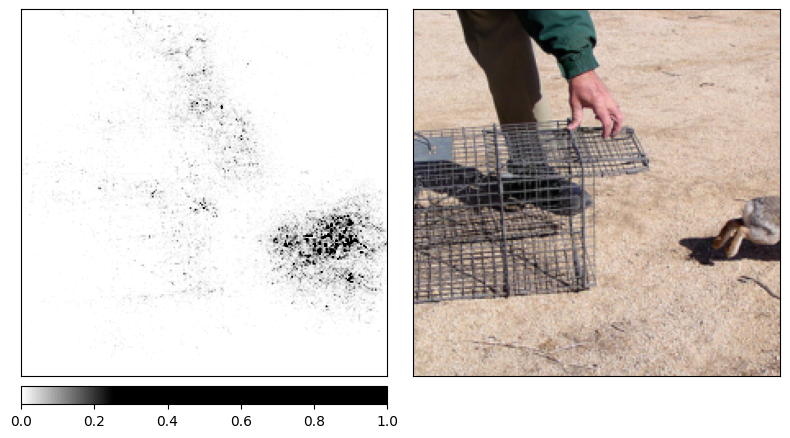

In [14]:
_ = viz.visualize_image_attr_multiple(np.transpose(attributions_ig_nt.squeeze().numpy(), (1,2,0)),
                                      np.array(all_images[2]),
                                      ["heat_map", "original_image"],
                                      ["positive", "all"],
                                      cmap=default_cmap,
                                      show_colorbar=True)

In [15]:
occlusion = Occlusion(model)

attributions_occ = occlusion.attribute(single_data,
                                       strides = (3, 8, 8),
                                       target=single_pred,
                                       sliding_window_shapes=(3, 15, 15),
                                       baselines=0)

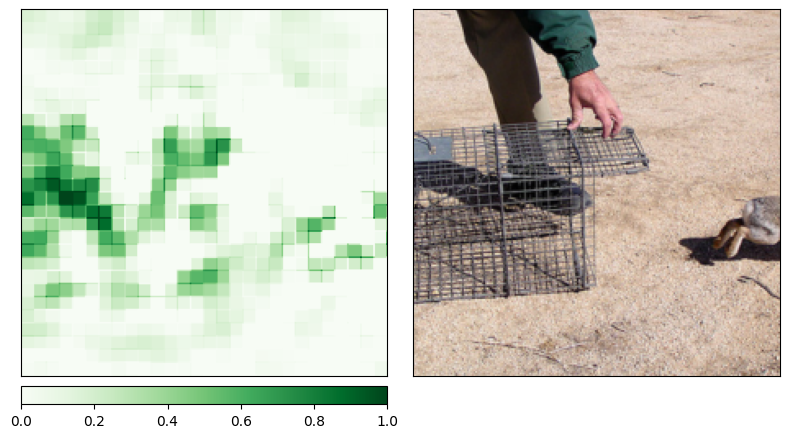

In [16]:
_ = viz.visualize_image_attr_multiple(np.transpose(attributions_occ.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.array(all_images[2]),
                                      ["heat_map", "original_image"],
                                      ["positive", "all"],
                                      show_colorbar=True,
                                      outlier_perc=2,
                                      )

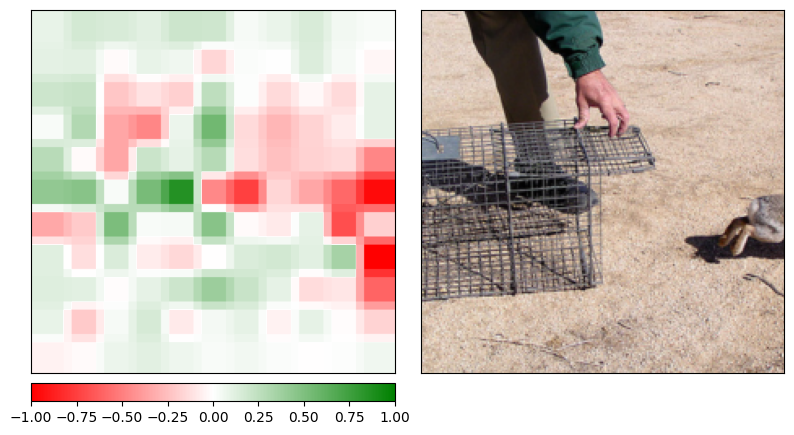

In [17]:
occlusion = Occlusion(model)

attributions_occ2 = occlusion.attribute(single_data,
                                       strides = (3, 20, 20),
                                       target=single_pred,
                                       sliding_window_shapes=(3, 25, 25),
                                       baselines=0)
_2 = viz.visualize_image_attr_multiple(np.transpose(attributions_occ2.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.array(all_images[2]),
                                      ["heat_map", "original_image"],
                                      ["all", "positive"],
                                      show_colorbar=True,
                                      outlier_perc=2,
                                      )

In [18]:
%%time
occlusion = Occlusion(model)
attributions_occ_all_25 = occlusion.attribute(tensor_images,
                                        strides = (3, 20, 20),
                                        target = preds2,
                                        sliding_window_shapes = (3, 25, 25),
                                        baselines=0)


CPU times: total: 6min 30s
Wall time: 1min 38s


In [19]:
%%time
occlusion = Occlusion(model)
attributions_occ_all_15 = occlusion.attribute(tensor_images,
                                              strides = (3, 8, 8),
                                              target = preds2,
                                              sliding_window_shapes = (3, 15, 15),
                                              baselines=0)

CPU times: total: 43min 18s
Wall time: 10min 57s


In [20]:
%%time
saliency = Saliency(model)
attr_saliency = saliency.attribute(tensor_images, target=preds2)

D:\Mini\Inzynierka\XAI_ensemblings_BS_MS\venv\lib\site-packages\captum\_utils\gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


CPU times: total: 11.6 s
Wall time: 3.08 s


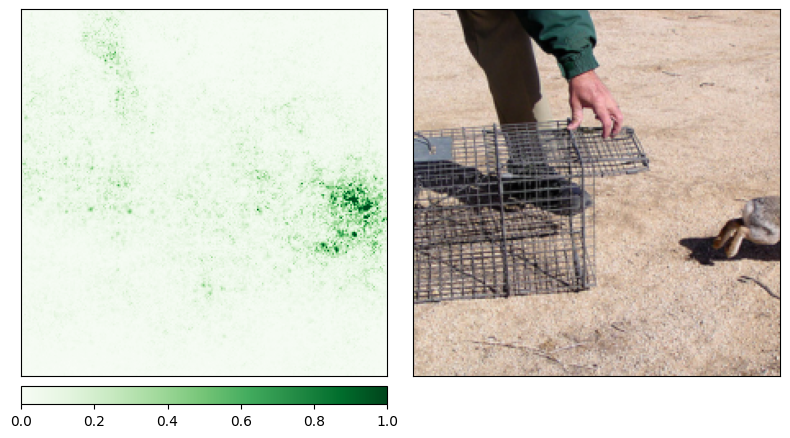

In [21]:
_3 = viz.visualize_image_attr_multiple(np.transpose(attr_saliency[2].numpy(), (1,2,0)),
                                       np.array(all_images[2]),
                                       ["heat_map", "original_image"],
                                       ["positive", "positive"],
                                       show_colorbar=True,
                                       outlier_perc=2,
                                       )

In [22]:
def sample_xai(images):
    if images.shape[0] == 1:
        target = single_pred
    else:
        target = single_pred.repeat(images.shape[0])
    xai = occlusion.attribute(images,
                              strides = (3, 40, 40),
                              target=target,
                              sliding_window_shapes=(3,50, 50),
                              baselines=0)
    return xai
#Metrics.stability(sample_xai, single_data.squeeze(dim=0), single_data.repeat(10,1,1,1))

# Ensembles

In [23]:
x = torch.cat([attributions_occ, attributions_ig_nt])
aggregated1 = Ensemble.basic(x, aggregating_func='avg')
aggregated2 = Ensemble.basic(x, aggregating_func='min')
aggregated3 = Ensemble.basic(x, aggregating_func='max')

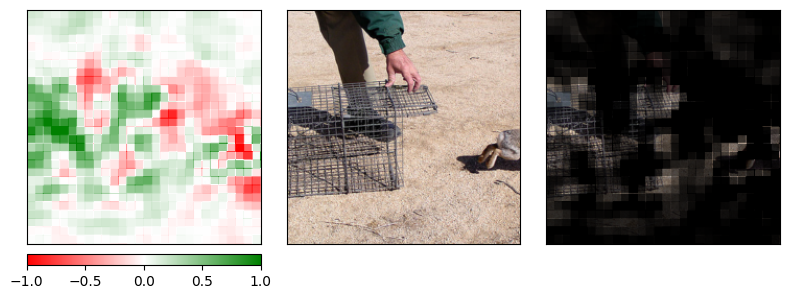

In [24]:
#display(transform.to_pil_image(aggregated1[0]))
_ = viz.visualize_image_attr_multiple(np.transpose(aggregated1.squeeze().cpu().detach().numpy(), (1,2,0)),
                                      np.array(all_images[2]),
                                      ["heat_map", "original_image", "masked_image"],
                                      ["all", "positive", "positive"],
                                      show_colorbar=True,
                                      outlier_perc=2,
                                      )

In [25]:
all_stacked = torch.stack([attributions_occ_all_15, attributions_occ_all_25], dim=1)

In [26]:
%%time
attr_agg_avg = Ensemble.basic(all_stacked, aggregating_func='avg')
attr_agg_min = Ensemble.basic(all_stacked, aggregating_func='min')
attr_agg_max = Ensemble.basic(all_stacked, aggregating_func='max')

CPU times: total: 62.5 ms
Wall time: 15.5 ms


In [27]:
plt.style.use('fast')

In [28]:
def plot_explanations(images, explanations_dict, classes_predicted,
                      #cmaps=[default_cmap, None, None, None, None, None, None],
                      method = "heat_map"):
    nrow, ncol = len(images), len(explanations_dict.keys())+1
    fig, ax = plt.subplots(nrows = nrow, ncols = ncol, figsize=(14, 3*nrow))
    columns_names = ["Original"] + list(explanations_dict.keys())
    for col, col_name in zip(ax[0], columns_names):
        col.title.set_text(col_name)
    for i, img in enumerate(images):
        ax[i,0].xaxis.set_ticks_position("none")
        ax[i,0].yaxis.set_ticks_position("none")
        ax[i,0].set_yticklabels([])
        ax[i,0].set_xticklabels([])
        ax[i,0].imshow(np.array(images[i]), vmin=0, vmax=255)
        ax[i,0].set_ylabel(classes_predicted[i], size='large')
        for j, (col, (key, explanations)) in enumerate(zip(ax[i,1:], explanations_dict.items())):
            #ith image, jth explanation
            #expl = explanations[i,j]
            expl = explanations[j]
            sign = "all"
            cmap=None
            if expl.amin() >= 0:
                sign = "positive"
                cmap = default_cmap
            _ = viz.visualize_image_attr(np.transpose(expl.squeeze().numpy(), (1,2,0)),
                                         original_image=np.array(img),
                                         method=method,
                                         sign=sign,
                                         plt_fig_axis=(fig, col),
                                         show_colorbar=True,
                                         outlier_perc=2,
                                         cmap=cmap,
                                         use_pyplot=False
                                         )
    plt.savefig(f"results/{id}/plots.png")
    plt.show()

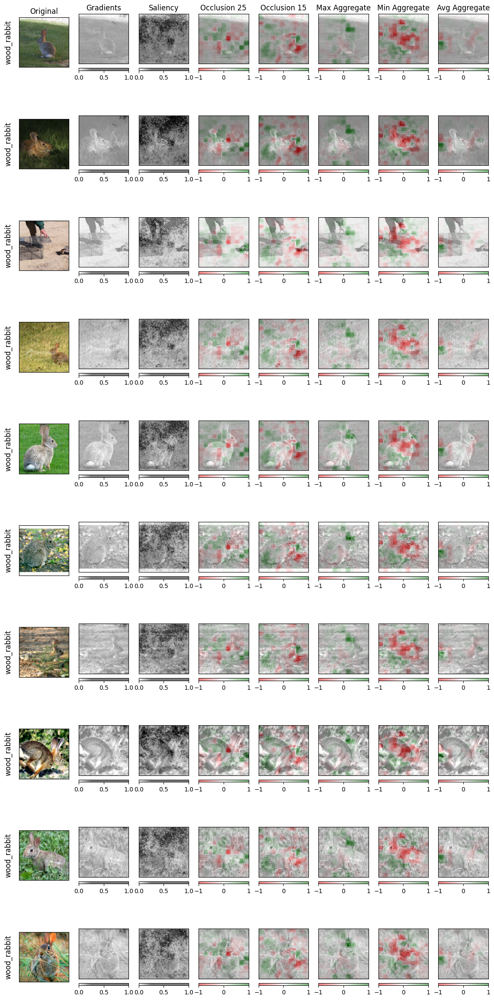

In [29]:
expl_dict = {"Gradients":attributions_ig_nt_all, "Saliency":attr_saliency, "Occlusion 25":attributions_occ_all_25,
             "Occlusion 15":attributions_occ_all_15, "Max Aggregate":attr_agg_max,
             "Min Aggregate":attr_agg_min, "Avg Aggregate":attr_agg_avg}
predicted_names = [imagenet_classes_dict[str(i.item())][1] for i in preds2]
plot_explanations(all_images, expl_dict, predicted_names, method="blended_heat_map")

In [30]:
predict = lambda x: torch.nn.Softmax(dim=0)(model(x))
per_explanation = dict_to_matrix(proper_data, expl_dict, predict, tensor_masks)

In [31]:
per_explanation

,DIR0.0,CIR Same0.0,CIR Max0.0,Average Recall0.0,Average Precision0.0,F1_score0.0,IOU0.0,DIR0.1,CIR Same0.1,CIR Max0.1,...,Average Precision0.8,F1_score0.8,IOU0.8,DIR0.9,CIR Same0.9,CIR Max0.9,Average Recall0.9,Average Precision0.9,F1_score0.9,IOU0.9
Gradients,1.0,0.179563,0.179563,1.000000,0.242508,0.370840,0.242508,0.0,0.000000,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
Saliency,1.0,0.179563,0.179563,1.000000,0.242508,0.370840,0.242508,0.3,0.006026,-0.001357,...,0.040816,0.0,0.000764,0.0,-0.001725,-0.001725,0.000386,0.030303,0.0,0.000383
Occlusion 25,1.0,0.057467,-0.263432,0.634804,0.254280,0.331813,0.209269,0.8,0.028190,-0.048777,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
Occlusion 15,1.0,0.091937,-0.321346,0.585397,0.252196,0.322555,0.205068,0.5,0.017214,-0.036571,...,0.095153,0.0,0.042290,0.1,-0.003005,-0.003111,0.030591,0.100000,0.0,0.030591
Max Aggregate,1.0,0.092057,-0.366344,0.720750,0.244457,0.339265,0.216674,0.8,0.037240,-0.066846,...,0.095153,0.0,0.042290,0.1,-0.003005,-0.003111,0.030591,0.100000,0.0,0.030591
Min Aggregate,0.9,0.077430,-0.273459,0.499452,0.265815,0.308822,0.193426,0.5,0.005208,-0.036866,...,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
Avg Aggregate,0.8,0.097558,-0.365622,0.612804,0.253149,0.328481,0.209008,0.8,0.042319,-0.042982,...,0.100000,0.0,0.021784,0.1,-0.003199,-0.003256,0.018656,0.100000,0.0,0.018656


In [32]:
per_image = pd.DataFrame()
for i in range(10):
    threshold = i/10
    per_image[f"Average Recall{threshold}"] = torch.mean(torch.stack([Metrics.accordance_recall(expl, tensor_masks, threshold) for expl in expl_dict.values()]), dim=0).numpy()
    per_image[f"Average Precision{threshold}"] = torch.mean(torch.stack([Metrics.accordance_precision(expl, tensor_masks, threshold) for expl in expl_dict.values()]), dim=0).numpy()
per_image["Consistency"] = [Metrics.consistency(expls) for expls in torch.stack(list(expl_dict.values()), dim=1)]
per_image

,Average Recall0.0,Average Precision0.0,Average Recall0.1,Average Precision0.1,Average Recall0.2,Average Precision0.2,Average Recall0.3,Average Precision0.3,Average Recall0.4,Average Precision0.4,...,Average Precision0.5,Average Recall0.6,Average Precision0.6,Average Recall0.7,Average Precision0.7,Average Recall0.8,Average Precision0.8,Average Recall0.9,Average Precision0.9,Consistency
0,0.695771,0.118223,0.070163,0.655524,0.000419,0.285714,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.075543
1,0.890972,0.288002,0.032646,0.716241,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.082022
2,0.998014,0.026748,0.747834,0.083180,0.647796,0.179626,0.596369,0.348955,0.486123,0.468030,...,0.621071,0.339900,0.673913,0.292336,0.680215,0.155714,0.473032,0.114606,0.471861,0.018814
3,0.510657,0.060509,0.027362,0.598997,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.104752
4,0.608641,0.328156,0.037810,0.651063,0.010366,0.816608,0.004865,0.285714,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.053815
5,0.674028,0.270372,0.027034,0.417710,0.004832,0.279286,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.070903
6,0.631099,0.158451,0.104381,0.564109,0.052656,0.629365,0.039223,0.689106,0.029718,0.727913,...,0.831121,0.011171,0.857143,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030476
7,0.765056,0.455146,0.128488,0.653225,0.018298,0.730643,0.004886,0.285714,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.042635
8,0.837717,0.396307,0.049771,0.855343,0.005674,0.428571,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.074273
9,0.606912,0.405107,0.032105,0.715642,0.000002,0.142857,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.068344


In [33]:
#with open(f'results/{id}/explanations.pickle', 'wb') as handle:
#    pickle.dump(expl_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
#per_explanation.to_csv(f'results/{id}/per_expl.csv')
#per_image.to_csv(f'results/{id}/per_image.csv')
with open(f'results/{id}/explanations.pickle', 'rb') as handle:
    b = pickle.load(handle)
b.keys()

dict_keys(['Gradients', 'Saliency', 'Occlusion 25', 'Occlusion 15', 'Max Aggregate', 'Min Aggregate', 'Avg Aggregate'])

In [45]:
b=torch.stack([attributions_ig_nt_all, attr_saliency, attributions_occ_all_25,attributions_occ_all_15], dim=1)

In [46]:
%%time
Ensemble.supervisedXAI(b, tensor_masks[:,0])

CPU times: total: 625 ms
Wall time: 620 ms


tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],

         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]],


        [[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
        

In [5]:
all_50_img = [x for classid in all_classes for x in images_list(images_dir + classid + "\\")]
all_50_tens = torch.stack([F.pil_to_tensor(x) for x in all_50_img])
all_msks = [(classid, [F.pil_to_tensor(img) for img in images_list(masks_dir + classid + "\\")]) for classid in all_classes]
all_msks = torch.stack([((temp_mask[1] * 256 + temp_mask[0]) == imagenetS50_ids_dict[classid]).float().repeat(3,1,1) for classid, classmasks in all_msks for temp_mask in classmasks])
all_50_expl_dicts = [pickle.load(open(f'results/{classid}/explanations.pickle', 'rb')) for classid in all_classes]
all_500_expl_dict = {key:torch.cat([expl_dict[key] for expl_dict in all_50_expl_dicts], dim=0) for key in all_50_expl_dicts[0].keys()}
data_stacked = torch.stack(list(all_500_expl_dict.values())[:-3], dim=1)

In [6]:
all_msks.shape, data_stacked.shape

(torch.Size([500, 3, 224, 224]), torch.Size([500, 4, 3, 224, 224]))

In [7]:
import importlib, gc
importlib.reload(Ensemble)
gc.collect()
result = Ensemble.supervisedXAI(data_stacked, all_msks[:,0], n_folds=5)
#with open(f'results/All500SupervisedExplanations.pickle', 'wb') as handle:
#    pickle.dump(result, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [8]:
result.shape

torch.Size([500, 224, 224])

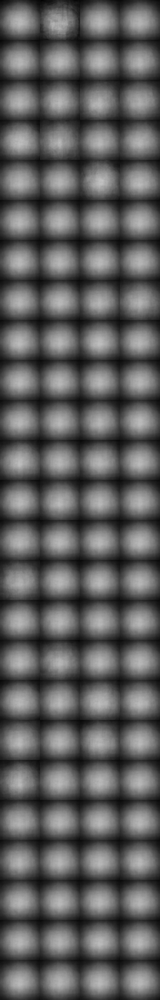

In [13]:
foo = result#*(result>0.3).float()
foo = torch.stack([foo, foo, foo], dim=1)
stacked_foo = torch.cat([torch.cat([foo[000+i+4*j] for i in range(4)], dim=2) for j in range(25)], dim=1)
display(transform.to_pil_image(stacked_foo))

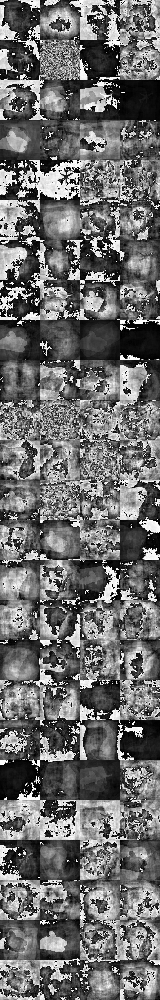

In [6]:
new_data = torch.cat([data_stacked, all_50_tens.unsqueeze(dim=1)], dim=1)
result = Ensemble.supervisedXAI(new_data, all_msks[:,0], n_folds=5)
#with open(f'results/All500SupervisedExplanationsWithOrgData.pickle', 'wb') as handle:
    #pickle.dump(result, handle, protocol=pickle.HIGHEST_PROTOCOL)
foo = torch.stack([result, result, result], dim=1)
#foo = (foo>0.5).float()
stacked_foo = torch.cat([torch.cat([foo[000+i+4*j] for i in range(4)], dim=2) for j in range(25)], dim=1)
display(transform.to_pil_image(stacked_foo))

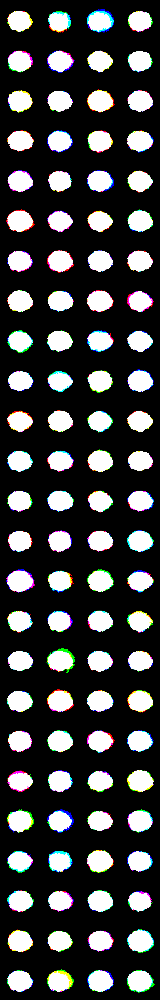

In [15]:
result = Ensemble.supervisedXAI(data_stacked, all_msks[:,0], n_folds=5, shuffle=True)
#with open(f'results/All500SupervisedExplanationsShuffled.pickle', 'wb') as handle:
    #pickle.dump(result, handle, protocol=pickle.HIGHEST_PROTOCOL)
foo = (result>0.5).float()
stacked_foo = torch.cat([torch.cat([foo[000+i+4*j] for i in range(4)], dim=2) for j in range(25)], dim=1)
display(transform.to_pil_image(stacked_foo))

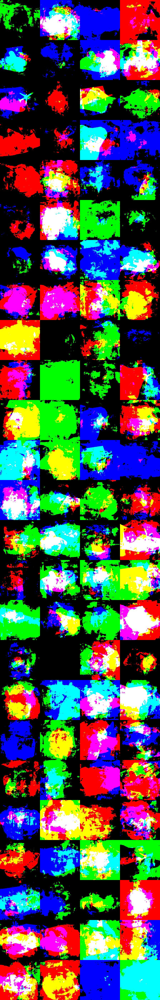

In [35]:
new_data = torch.cat([data_stacked, all_50_tens.unsqueeze(dim=1)], dim=1)
result = Ensemble.supervisedXAI(new_data, all_msks[:,0], n_folds=5, shuffle=True)
#with open(f'results/All500SupervisedExplanationsWithOrgDataShuffled.pickle', 'wb') as handle:
    #pickle.dump(result, handle, protocol=pickle.HIGHEST_PROTOCOL)
foo = (result>0.5).float()
stacked_foo = torch.cat([torch.cat([foo[000+i+4*j] for i in range(4)], dim=2) for j in range(25)], dim=1)
display(transform.to_pil_image(stacked_foo))

In [7]:
model = resnet50(weights=ResNet50_Weights.DEFAULT)
model.eval()
resnet_transform = ResNet50_Weights.DEFAULT.transforms()
pipeline = lambda images: torch.stack([resnet_transform(image) for image in images])
all_500_org = pipeline([x for classid in all_classes for x in images_list(images_dir + classid + "\\", resize=False)])

In [8]:
import gc
predict_test = lambda x: torch.nn.Softmax(dim=0)(model(x))
all = []
for i in range(50):
    gc.collect(2)
    res = predict_test(all_500_org[i*10:(i+1)*10]).detach()
    all.append(res)
org_preds = torch.cat(all, dim=0)

In [9]:
with open(f'results/All500SupervisedExplanations.pickle', 'rb') as handle:
    result1 = pickle.load(handle)
with open(f'results/All500SupervisedExplanationsShuffled.pickle', 'rb') as handle:
    result2 = pickle.load(handle)
with open(f'results/All500SupervisedExplanationsWithOrgData.pickle', 'rb') as handle:
    result3 = pickle.load(handle)
with open(f'results/All500SupervisedExplanationsWithOrgDataShuffled.pickle', 'rb') as handle:
    result4 = pickle.load(handle)
baseline_black = torch.zeros_like(result1)
baseline_black[:,:,result1.shape[2]//2, result1.shape[3]//2] = 1
baseline_white = torch.ones_like(result1)
dict_krr = {'SE':result1, 'SES':result2, 'SEWOD':result3, 'SEWODS':result4, 'Baseline_black':baseline_black, 'Baseline_white':baseline_white}
data_before = all_500_org
def predict_loop(x):
    all = []
    if torch.all(x == data_before):
        return org_preds
    else:
        for i in range(50):
            gc.collect(2)
            res = predict_test(x[i*10:(i+1)*10]).detach()
            all.append(res)
        return torch.cat(all, dim=0)
bar = dict_to_matrix(all_500_org,dict_krr,predict_loop,all_msks)
bar.to_csv('xd.csv')

In [5]:
perc = []
csvs = [pd.read_csv(f'results/{id}/per_expl.csv', index_col=0) for id in all_classes]
for frame in csvs:
    max_single_data = frame.loc[['Gradients', 'Saliency', 'Occlusion 25', 'Occlusion 15']].max(axis=0)
    max_agg_data = frame.loc[['Max Aggregate', 'Min Aggregate', 'Avg Aggregate']].max(axis=0)
    perc.append((max_agg_data>max_single_data).sum()/len(max_single_data))
#aggregated_csvs = sum(aggregated_csvs)/len(aggregated_csvs)
#aggregated_csvs.to_csv('aggregated_csvs.csv')

In [6]:
sum(perc)/len(perc)

0.2788571428571429

In [7]:
sum([p for p in perc if p>0.2])/len([p for p in perc if p>0.2])

0.32976190476190476

In [25]:
aggregated_csvs = pd.read_csv('imagenet_aggregated_results.csv', index_col=0)
max_single_agg = aggregated_csvs.loc[['Gradients', 'Saliency', 'Occlusion 25', 'Occlusion 15']].max(axis=0)
max_agg_agg = aggregated_csvs.loc[['Max Aggregate', 'Min Aggregate', 'Avg Aggregate']].max(axis=0)
max_krr_agg = aggregated_csvs.loc[['SE', 'SES', 'SEWOD', 'SEWODS']].max(axis=0)
max_baseline_agg = aggregated_csvs.loc[['Baseline_black', 'Baseline_white']].max(axis=0)

In [29]:
aggregated_csvs.loc[['Baseline_black', 'Baseline_white']]

,DIR0.0,CIR Same0.0,CIR Max0.0,Average Recall0.0,Average Precision0.0,F1_score0.0,IOU0.0,DIR0.1,CIR Same0.1,CIR Max0.1,...,Average Precision0.8,F1_score0.8,IOU0.8,DIR0.9,CIR Same0.9,CIR Max0.9,Average Recall0.9,Average Precision0.9,F1_score0.9,IOU0.9
Baseline_black,1.0,0.37173,0.37173,0.00006,0.720000,0.000000,0.000060,0.046,0.001227,0.001002,...,0.720000,0.000000,0.000060,0.046,0.001227,0.001002,0.00006,0.720000,0.000000,0.000060
Baseline_white,1.0,0.37173,0.37173,1.00000,0.363176,0.487792,0.363176,1.000,0.371730,0.371730,...,0.363176,0.487792,0.363176,1.000,0.371730,0.371730,1.00000,0.363176,0.487792,0.363176


In [26]:
[(max_agg_agg.iloc[7*k:]>max_single_agg.iloc[7*k:]).sum()/len(max_single_agg.iloc[7*k:]) for k in range(9)]

[0.45714285714285713,
 0.49206349206349204,
 0.5,
 0.5102040816326531,
 0.5238095238095238,
 0.5142857142857142,
 0.5,
 0.47619047619047616,
 0.42857142857142855]

In [27]:
[(max_krr_agg.iloc[7*k:]>max_single_agg.iloc[7*k:]).sum()/len(max_single_agg.iloc[7*k:]) for k in range(9)]

[0.7142857142857143,
 0.746031746031746,
 0.7321428571428571,
 0.7346938775510204,
 0.7142857142857143,
 0.7142857142857143,
 0.7142857142857143,
 0.7142857142857143,
 0.7142857142857143]

In [28]:
[(max_baseline_agg.iloc[7*k:]>max_single_agg.iloc[7*k:]).sum()/len(max_single_agg.iloc[7*k:]) for k in range(9)]

[0.9428571428571428, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

In [9]:
(max_krr_agg-max_single_agg)/(max_single_agg)

DIR0.0                  -1.000000
CIR Same0.0             -1.000000
CIR Max0.0              -1.000000
Average Recall0.0        0.000000
Average Precision0.0     0.038490
                          ...    
CIR Max0.9                    NaN
Average Recall0.9       25.530873
Average Precision0.9     2.279012
F1_score0.9                   NaN
IOU0.9                  25.173147
Length: 70, dtype: float64

In [13]:
aggregated_csvs.iloc[:,35:63] #[1, 3, 3, 3, 4, 4, 4, 4, 4, 2]

,DIR0.5,CIR Same0.5,CIR Max0.5,Average Recall0.5,Average Precision0.5,F1_score0.5,IOU0.5,DIR0.6,CIR Same0.6,CIR Max0.6,...,Average Precision0.7,F1_score0.7,IOU0.7,DIR0.8,CIR Same0.8,CIR Max0.8,Average Recall0.8,Average Precision0.8,F1_score0.8,IOU0.8
Gradients,0.000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
Saliency,0.126,0.001441,-0.003953,0.001106,0.329491,0.000051,0.001072,0.080,0.001801,-0.002117,...,0.198468,0.0,0.000382,0.050,0.000837,-0.000435,0.000242,0.166099,0.0,0.000241
Occlusion 25,0.120,0.003374,-0.007203,0.021062,0.146528,0.000000,0.015073,0.076,0.002979,-0.005697,...,0.082030,0.0,0.008979,0.058,0.003037,-0.002569,0.010673,0.067433,0.0,0.006951
Occlusion 15,0.072,0.004902,-0.002603,0.010488,0.154932,0.000000,0.007736,0.050,0.002767,-0.001852,...,0.065985,0.0,0.004725,0.020,0.000809,-0.001786,0.005834,0.046808,0.0,0.004175
Max Aggregate,0.134,0.006729,-0.006630,0.022920,0.179232,0.000000,0.016278,0.090,0.003680,-0.005518,...,0.097243,0.0,0.009486,0.064,0.003325,-0.002880,0.011728,0.081527,0.0,0.007929
Min Aggregate,0.052,0.001931,-0.003140,0.008630,0.100098,0.000000,0.006299,0.040,0.001917,-0.002032,...,0.043165,0.0,0.004127,0.018,0.000976,-0.001378,0.004780,0.026410,0.0,0.003170
Avg Aggregate,0.094,0.003617,-0.005820,0.014735,0.129879,0.000000,0.010253,0.066,0.001965,-0.004145,...,0.064148,0.0,0.006690,0.038,0.001586,-0.002864,0.008293,0.042236,0.0,0.005601
SE,0.000,0.000000,0.000000,0.469443,0.598002,0.000000,0.316808,0.000,0.000000,0.000000,...,0.696692,0.0,0.041523,0.000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
SES,0.000,0.000000,0.000000,0.472251,0.599835,0.000000,0.319370,0.000,0.000000,0.000000,...,0.701859,0.0,0.046448,0.000,0.000000,0.000000,0.000004,0.014000,0.0,0.000004
SEWOD,0.000,0.000000,0.000000,0.447727,0.448709,0.000000,0.246826,0.000,0.000000,0.000000,...,0.471624,0.0,0.201992,0.000,0.000000,0.000000,0.288310,0.474843,0.0,0.180949
